## Considerações iniciais

### Instalação das bibliotecas importantes

In [1]:
# !pip install opencv-python
# !pip install matplotlib
# !pip install imageio
# !pip install scipy

### Importação das Bibliotecas 

In [19]:
from preprocessing.imagens import tranformImagem
from models.RegressorLinear import MultipleRegressorLinear
from models.neuralNetworks import LogisticPerceptronNetwork, multilayerPerceptronNetwork
from preprocessing.normalize import zscore, minMaxScale
from preprocessing.splitdata import randomSplit
from metrics.classification import classesEncoder,accuracy, statics
from numpy import array,append, arange
from plot.chart import plot
from pathlib import Path
import time

## Atividade 1

In [3]:
# Defina a pasta onde estão as imagens
data_path = Path(r'data')

# Extensões de imagem consideradas para a extração
extensoes = ['.centerlight', '.glasses', '.happy', '.leftlight', '.noglasses', '.normal', '.rightlight', '.sad', '.sleepy', '.surprised', '.wink']

# Tamanho das imagens
size = (40, 40)
X_40 = tranformImagem(
    dict_file = data_path,
    extensoes = extensoes,
    size = size,
    flatten = True    
)
print(f"Tamanho da base de dados: {X_40.shape}")

# Tamanho das imagens
size = (100, 100)
X_100 = tranformImagem(
    dict_file = data_path,
    extensoes = extensoes,
    size = size,
    flatten = True    
)
print(f"Tamanho da base de dados: {X_100.shape}")


# Tamanho das imagens
size = (30, 30)
X = tranformImagem(
    dict_file = data_path,
    extensoes = extensoes,
    size = size,
    flatten = True    
)
print(f"Tamanho da base de dados: {X.shape}")

Tamanho da base de dados: (165, 1600)
Tamanho da base de dados: (165, 10000)
Tamanho da base de dados: (165, 900)


In [4]:
grupo = 11
Y = classesEncoder(X,clusters = grupo, one_hot_encoder=True)

Y.shape

(165, 15)

## Atividade 2

Para os rotulos que definem as classes do modelo, a codficação das classes se deu pelo método one hot code

In [7]:
# Erro desejado
erro_tolerado = 0.9
epocas = 2000
taxa_aprendizado = 1e-2
# Divide 80% dos dados para treino e 20% para teste
test_size = 0.2

# Rodas de treinamento e teste
rounds = 50



### Classificador Linear de Mínimos Quadráticos

Para o classificador linear de mínimos quadráticos, inicialmente, é experimentado o classificador usando os dados sem gerar nenhuma transformação em suas grandezas. Ao passo que observou-se seu comportamento com dados normalizados usando o método z-score e o método de modificação de escala Mínimo Máximo.

#### Dados não normalizados

Com os atributos sem nunhma normalização, isso é possível observar nas linhas de código abaixo, o desempenho do modelo dado pela sua acurácia para os dados de teste. Para uma melhor analise a tabela abaixo ilustra melhor o comportamento da acurácia do modelo.
| Métrica   | Acurácia (%)  |
|-----------|---------|
| Média     | 5.2    |
| Máx       | 18.1   |
| Mín       | 0.00    |
| Mediana   | 3.03    |
| Desvio    | 4.96    |

Além disso, o modelo levou em média 19 segundo para executar as 50 rodadas de treinamento e teste.

In [7]:
# marca início
start = time.time()  

mrl = MultipleRegressorLinear(
    model="classifier"
)
# Divisão dos dados de treino e teste
x_treino, y_treino, x_teste, y_teste =  randomSplit(X, Y, test_size= test_size)
mrl.fit(
    X=x_treino,    
    Y=y_treino
)
end = time.time()     # marca fim
acc= accuracy(
    Y = y_teste, 
    Y_pred = mrl.predict(x_teste)
)
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mrl.metrics}")
print(f"acuracia dos dados de teste: {acc}")


Tempo de execução: 0.2054 segundos
acuracia dos dados de treinamento: {'accuracy': np.float64(1.0)}
acuracia dos dados de teste: 0.5454545454545454


#### Normalização Minimo Máximo

Com os atributos normalizados utilizando o método Min-Max, isso é possível observar nas linhas de código abaixo, o desempenho do modelo dado pela sua acurácia para os dados de teste. Para uma melhor análise, a tabela abaixo ilustra melhor o comportamento da acurácia do modelo.

| Métrica | Acurácia (%) |
| ------- | ------------ |
| Média   | 97.33        |
| Máx     | 100.00       |
| Mín     | 87.88        |
| Mediana | 96.97        |
| Desvio  | 3.07         |

Além disso, o modelo levou em média 6.32 segundos para executar as 50 rodadas de treinamento e teste.

In [100]:
# marca início
start = time.time()  
X_nor = minMaxScale(X=X)
mrl = MultipleRegressorLinear(
    model="classifier"
)

# Divisão dos dados de treino e teste
x_treino, y_treino, x_teste, y_teste =  randomSplit(X_nor, Y, test_size= test_size)
mrl.fit(
    X=x_treino,    
    Y=y_treino
)
end = time.time()     # marca fim
acc= accuracy(
    Y = y_teste, 
    Y_pred = mrl.predict(x_teste)
)
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mrl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

Tempo de execução: 0.1678 segundos
acuracia dos dados de treinamento: {'accuracy': np.float64(1.0)}
acuracia dos dados de teste: 0.9696969696969697


In [110]:
# marca início
start = time.time()  
X_nor = minMaxScale(X=X, metodo="-1")
mrl = MultipleRegressorLinear(
    model="classifier"
)

# Divisão dos dados de treino e teste
x_treino, y_treino, x_teste, y_teste =  randomSplit(X_nor, Y, test_size= test_size)
mrl.fit(
    X=x_treino,    
    Y=y_treino
)
end = time.time()     # marca fim
acc= accuracy(
    Y = y_teste, 
    Y_pred = mrl.predict(x_teste)
)
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mrl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

Tempo de execução: 0.1066 segundos
acuracia dos dados de treinamento: {'accuracy': np.float64(1.0)}
acuracia dos dados de teste: 0.9393939393939394


#### Normalização z-score

Com os atributos normalizados utilizando o método zscore, isso é possível observar nas linhas de código abaixo, o desempenho do modelo dado pela sua acurácia para os dados de teste. Para uma melhor análise, a tabela abaixo ilustra melhor o comportamento da acurácia do modelo.

| Métrica | Acurácia (%) |
| ------- | ------------ |
| Média   | 96.91        |
| Máx     | 100.00       |
| Mín     | 84.85        |
| Mediana | 96.97        |
| Desvio  | 3.06         |

Além disso, o modelo levou em média 6.17 segundos para executar as 50 rodadas de treinamento e teste.

In [145]:
# marca início
start = time.time()  
X_nor = zscore(X=X)

mrl = MultipleRegressorLinear(
    model="classifier"
)

# Divisão dos dados de treino e teste
x_treino, y_treino, x_teste, y_teste =  randomSplit(X_nor, Y, test_size= test_size)
mrl.fit(
    X=x_treino,    
    Y=y_treino
)
end = time.time()     # marca fim
acc = accuracy(
    Y = y_teste, 
    Y_pred = mrl.predict(x_teste)
)
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mrl.metrics}")
print(f"acuracia dos dados de teste: {acc}")


Tempo de execução: 0.1601 segundos
acuracia dos dados de treinamento: {'accuracy': np.float64(1.0)}
acuracia dos dados de teste: 0.9090909090909091


#### MODELO ESCOLHIDO


In [12]:
# marca início
start = time.time()  

X_nor = zscore(X=X)

mrl = MultipleRegressorLinear(
    model="classifier"
)
all_acc = array([])
for i in range(rounds):
    # Divisão dos dados de treino e teste
    x_treino, y_treino, x_teste, y_teste =  randomSplit(X_nor, Y, test_size= test_size)
    mrl.fit(
        X=x_treino,    
        Y=y_treino
    )
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mrl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(acc)}")


Tempo de execução: 3.2988 segundos
acuracia dos dados de teste: {'min': np.float64(0.9696969696969697), 'max': np.float64(0.9696969696969697), 'mean': np.float64(0.9696969696969697), 'median': np.float64(0.9696969696969697), 'std': np.float64(0.0)}


### Perceptron Logístico

O classificador do tipo percetron logístico, inicialmente, é treinado usando as amostras reais sem gerar nenhuma transformações sobre os dados. Ao passo que o modelo também é treinado usando dados normalizados, em especial odotou-se os método z-score e o método de modificação de escala Mínimo Máximo. 

Para tanto foi avaliado duas configurações de rede, nos dados normalizados, a primeira com função de ativação do tipo Sigmóide Logística e a segunda do tipo Tangente Hiperbólica. A escolha de analisar com melhor profundidade qual função de ativição escolher sobre o treinamento dos dados normalizados, da-se pelo fato de que as redes neurais são mais sensíveis a ordens de grandezas muito díspares.

#### Dados não normalizados

Quando não normalizado os dados, o modelo converge rápido. 

In [6]:

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X, 
    Y = Y, 
    test_size =  test_size)


mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='sigmoid',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.07575757575757576
2ª epoca de treinamento, Erro 0.07575757575757576
3ª epoca de treinamento, Erro 0.07575757575757576
4ª epoca de treinamento, Erro 0.07575757575757576
5ª epoca de treinamento, Erro 0.07575757575757576
6ª epoca de treinamento, Erro 0.07575757575757576
7ª epoca de treinamento, Erro 0.07575757575757576
8ª epoca de treinamento, Erro 0.07575757575757576
9ª epoca de treinamento, Erro 0.07575757575757576
10ª epoca de treinamento, Erro 0.07575757575757576
11ª epoca de treinamento, Erro 0.07575757575757576
12ª epoca de treinamento, Erro 0.07575757575757576
13ª epoca de treinamento, Erro 0.07575757575757576
14ª epoca de treinamento, Erro 0.07575757575757576
15ª epoca de treinamento, Erro 0.07575757575757576
16ª epoca de treinamento, Erro 0.07575757575757576
17ª epoca de treinamento, Erro 0.07575757575757576
18ª epoca de treinamento, Erro 0.07575757575757576
19ª epoca de treinamento, Erro 0.07575757575757576
20ª epoca de treinamento, Erro 0.0757575

In [7]:

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X, 
    Y = Y, 
    test_size =  test_size)

mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='tanh',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.06818181818181818
2ª epoca de treinamento, Erro 0.06818181818181818
3ª epoca de treinamento, Erro 0.06818181818181818
4ª epoca de treinamento, Erro 0.06818181818181818
5ª epoca de treinamento, Erro 0.06818181818181818
6ª epoca de treinamento, Erro 0.06818181818181818
7ª epoca de treinamento, Erro 0.06818181818181818
8ª epoca de treinamento, Erro 0.06818181818181818
9ª epoca de treinamento, Erro 0.06818181818181818
10ª epoca de treinamento, Erro 0.06818181818181818
11ª epoca de treinamento, Erro 0.06818181818181818
12ª epoca de treinamento, Erro 0.06818181818181818
13ª epoca de treinamento, Erro 0.06818181818181818
14ª epoca de treinamento, Erro 0.06818181818181818
15ª epoca de treinamento, Erro 0.06818181818181818
16ª epoca de treinamento, Erro 0.06818181818181818
17ª epoca de treinamento, Erro 0.06818181818181818
18ª epoca de treinamento, Erro 0.06818181818181818
19ª epoca de treinamento, Erro 0.06818181818181818
20ª epoca de treinamento, Erro 0.0681818

#### Normalização Mínimo Máximo

In [12]:

# Normaliza os dados
X_nor = minMaxScale(X=X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_nor, 
    Y = Y, 
    test_size =  test_size)

mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='tanh',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.06818181818181818
2ª epoca de treinamento, Erro 0.06818181818181818
3ª epoca de treinamento, Erro 0.06818181818181818
4ª epoca de treinamento, Erro 0.06818181818181818
5ª epoca de treinamento, Erro 0.06818181818181818
6ª epoca de treinamento, Erro 0.06818181818181818
7ª epoca de treinamento, Erro 0.06818181818181818
8ª epoca de treinamento, Erro 0.06818181818181818
9ª epoca de treinamento, Erro 0.06818181818181818
10ª epoca de treinamento, Erro 0.06818181818181818
11ª epoca de treinamento, Erro 0.06818181818181818
12ª epoca de treinamento, Erro 0.06818181818181818
13ª epoca de treinamento, Erro 0.06818181818181818
14ª epoca de treinamento, Erro 0.06818181818181818
15ª epoca de treinamento, Erro 0.06818181818181818
16ª epoca de treinamento, Erro 0.06818181818181818
17ª epoca de treinamento, Erro 0.06818181818181818
18ª epoca de treinamento, Erro 0.06818181818181818
19ª epoca de treinamento, Erro 0.06818181818181818
20ª epoca de treinamento, Erro 0.0681818

In [9]:

# Normaliza os dados
X_nor = minMaxScale(X=X)


# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_nor, 
    Y = Y, 
    test_size =  test_size)

mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='sigmoid',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.08333333333333333
2ª epoca de treinamento, Erro 0.08333333333333333
3ª epoca de treinamento, Erro 0.08333333333333333
4ª epoca de treinamento, Erro 0.08333333333333333
5ª epoca de treinamento, Erro 0.08333333333333333
6ª epoca de treinamento, Erro 0.08333333333333333
7ª epoca de treinamento, Erro 0.08333333333333333
8ª epoca de treinamento, Erro 0.08333333333333333
9ª epoca de treinamento, Erro 0.08333333333333333
10ª epoca de treinamento, Erro 0.08333333333333333
11ª epoca de treinamento, Erro 0.08333333333333333
12ª epoca de treinamento, Erro 0.08333333333333333
13ª epoca de treinamento, Erro 0.08333333333333333
14ª epoca de treinamento, Erro 0.08333333333333333
15ª epoca de treinamento, Erro 0.08333333333333333
16ª epoca de treinamento, Erro 0.08333333333333333
17ª epoca de treinamento, Erro 0.08333333333333333
18ª epoca de treinamento, Erro 0.08333333333333333
19ª epoca de treinamento, Erro 0.08333333333333333
20ª epoca de treinamento, Erro 0.0833333

#### Normalização zscore

In [10]:

# Normaliza os dados
X_nor = zscore(X=X)



# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_nor, 
    Y = Y, 
    test_size =  test_size)

mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='sigmoid',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.09848484848484848
2ª epoca de treinamento, Erro 0.25757575757575757
3ª epoca de treinamento, Erro 0.25757575757575757
4ª epoca de treinamento, Erro 0.2803030303030303
5ª epoca de treinamento, Erro 0.26515151515151514
6ª epoca de treinamento, Erro 0.2727272727272727
7ª epoca de treinamento, Erro 0.2727272727272727
8ª epoca de treinamento, Erro 0.2727272727272727
9ª epoca de treinamento, Erro 0.32575757575757575
10ª epoca de treinamento, Erro 0.3181818181818182
11ª epoca de treinamento, Erro 0.32575757575757575
12ª epoca de treinamento, Erro 0.32575757575757575
13ª epoca de treinamento, Erro 0.3333333333333333
14ª epoca de treinamento, Erro 0.3333333333333333
15ª epoca de treinamento, Erro 0.3333333333333333
16ª epoca de treinamento, Erro 0.3333333333333333
17ª epoca de treinamento, Erro 0.3333333333333333
18ª epoca de treinamento, Erro 0.3333333333333333
19ª epoca de treinamento, Erro 0.3333333333333333
20ª epoca de treinamento, Erro 0.3333333333333333
21

In [11]:
# Normaliza os dados
X_nor = zscore(X=X)


# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_nor, 
    Y = Y, 
    test_size =  test_size)

mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='tanh',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.12121212121212122
2ª epoca de treinamento, Erro 0.13636363636363635
3ª epoca de treinamento, Erro 0.20454545454545456
4ª epoca de treinamento, Erro 0.20454545454545456
5ª epoca de treinamento, Erro 0.19696969696969696
6ª epoca de treinamento, Erro 0.17424242424242425
7ª epoca de treinamento, Erro 0.29545454545454547
8ª epoca de treinamento, Erro 0.29545454545454547
9ª epoca de treinamento, Erro 0.2727272727272727
10ª epoca de treinamento, Erro 0.29545454545454547
11ª epoca de treinamento, Erro 0.3484848484848485
12ª epoca de treinamento, Erro 0.3484848484848485
13ª epoca de treinamento, Erro 0.2727272727272727
14ª epoca de treinamento, Erro 0.32575757575757575
15ª epoca de treinamento, Erro 0.29545454545454547
16ª epoca de treinamento, Erro 0.30303030303030304
17ª epoca de treinamento, Erro 0.29545454545454547
18ª epoca de treinamento, Erro 0.38636363636363635
19ª epoca de treinamento, Erro 0.36363636363636365
20ª epoca de treinamento, Erro 0.37121212121

#### Modelo selecionado

In [ ]:
# Normaliza os dados
X_nor = zscore(X=X)

start = time.time()
all_acc = array([])
for i in range(rounds):
    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_nor, 
        Y = Y, 
        test_size =  test_size)
    
    mpl = LogisticPerceptronNetwork(
        learning_rate=taxa_aprendizado,
        tol=erro_tolerado,
        test_size=test_size,
        max_iter=epocas,
        ativation='tanh',
        model = "classifier",
        solver="deltaGeneralizado"
    )
    
    mpl.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mpl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
end = time.time() 

1ª epoca de treinamento, Erro 0.10606060606060606
2ª epoca de treinamento, Erro 0.10606060606060606
3ª epoca de treinamento, Erro 0.12121212121212122
4ª epoca de treinamento, Erro 0.12121212121212122
5ª epoca de treinamento, Erro 0.12878787878787878
6ª epoca de treinamento, Erro 0.12878787878787878
7ª epoca de treinamento, Erro 0.10606060606060606
8ª epoca de treinamento, Erro 0.10606060606060606
9ª epoca de treinamento, Erro 0.12878787878787878
10ª epoca de treinamento, Erro 0.12121212121212122
11ª epoca de treinamento, Erro 0.12121212121212122
12ª epoca de treinamento, Erro 0.12121212121212122
13ª epoca de treinamento, Erro 0.09848484848484848
14ª epoca de treinamento, Erro 0.11363636363636363
15ª epoca de treinamento, Erro 0.12121212121212122
16ª epoca de treinamento, Erro 0.12121212121212122
17ª epoca de treinamento, Erro 0.12121212121212122
18ª epoca de treinamento, Erro 0.12121212121212122
19ª epoca de treinamento, Erro 0.12121212121212122
20ª epoca de treinamento, Erro 0.1212121

In [ ]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

Tempo de execução: 15.5842 segundos
acuracia dos dados de teste: {'min': np.float64(0.09090909090909091), 'max': np.float64(0.9393939393939394), 'mean': np.float64(0.7624242424242424), 'median': np.float64(0.7878787878787878), 'std': np.float64(0.17273896823774898)}


### MLP

In [13]:
epocas = 1000
# Erro desejado
erro_tolerado = 0.98

#### Uma camada

##### Não normalizado

In [ ]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.03787878787878788
2ª epoca de treinamento, Erro 0.030303030303030304
3ª epoca de treinamento, Erro 0.08333333333333333
4ª epoca de treinamento, Erro 0.09090909090909091
5ª epoca de treinamento, Erro 0.06818181818181818
6ª epoca de treinamento, Erro 0.03787878787878788
7ª epoca de treinamento, Erro 0.10606060606060606
8ª epoca de treinamento, Erro 0.06818181818181818
9ª epoca de treinamento, Erro 0.09090909090909091
10ª epoca de treinamento, Erro 0.07575757575757576
11ª epoca de treinamento, Erro 0.07575757575757576
12ª epoca de treinamento, Erro 0.05303030303030303
13ª epoca de treinamento, Erro 0.05303030303030303
14ª epoca de treinamento, Erro 0.09848484848484848
15ª epoca de treinamento, Erro 0.12878787878787878
16ª epoca de treinamento, Erro 0.13636363636363635
17ª epoca de treinamento, Erro 0.10606060606060606
18ª epoca de treinamento, Erro 0.15151515151515152
19ª epoca de treinamento, Erro 0.13636363636363635
20ª epoca de treinamento, Erro 0.128787

##### Dados normalizados

Inicialmente, analisou-se o comportamento do modelo com os métodos de normalização zscore e Mínimo-Máximo. Analisando seu comportamento com duas funções de ativações, a saber a tangente hiperbolica e a sigmoide logistica.

Para tanto, foram gerados experimentos com a heuristica do valor médio para especificar o número de neuronios ocultos
- p: numero de variáveis de entrada
- m: neuronios da saída

q_1 = (p+m)/2 = 157 neuronios


In [19]:
x_norm = zscore(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.4015151515151515
2ª epoca de treinamento, Erro 0.7803030303030303
3ª epoca de treinamento, Erro 0.9166666666666666
4ª epoca de treinamento, Erro 0.9621212121212122
5ª epoca de treinamento, Erro 0.9848484848484849
Convergência atingida na época 5
Tempo de execução: 1.2296 segundos
acuracia dos dados de treinamento: {'acuracia': array([0.40151515, 0.78030303, 0.91666667, 0.96212121, 0.98484848])}
acuracia dos dados de teste: 0.8484848484848485


In [15]:
x_norm = zscore(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.07575757575757576
2ª epoca de treinamento, Erro 0.14393939393939395
3ª epoca de treinamento, Erro 0.1590909090909091
4ª epoca de treinamento, Erro 0.1590909090909091
5ª epoca de treinamento, Erro 0.20454545454545456
6ª epoca de treinamento, Erro 0.1893939393939394
7ª epoca de treinamento, Erro 0.25757575757575757
8ª epoca de treinamento, Erro 0.29545454545454547
9ª epoca de treinamento, Erro 0.2803030303030303
10ª epoca de treinamento, Erro 0.3106060606060606
11ª epoca de treinamento, Erro 0.4090909090909091
12ª epoca de treinamento, Erro 0.4393939393939394
13ª epoca de treinamento, Erro 0.5454545454545454
14ª epoca de treinamento, Erro 0.48484848484848486
15ª epoca de treinamento, Erro 0.5303030303030303
16ª epoca de treinamento, Erro 0.5909090909090909
17ª epoca de treinamento, Erro 0.6136363636363636
18ª epoca de treinamento, Erro 0.5909090909090909
19ª epoca de treinamento, Erro 0.6363636363636364
20ª epoca de treinamento, Erro 0.6363636363636364
21ª

In [21]:
x_norm = minMaxScale(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.045454545454545456
2ª epoca de treinamento, Erro 0.12121212121212122
3ª epoca de treinamento, Erro 0.13636363636363635
4ª epoca de treinamento, Erro 0.09848484848484848
5ª epoca de treinamento, Erro 0.15151515151515152
6ª epoca de treinamento, Erro 0.15151515151515152
7ª epoca de treinamento, Erro 0.12878787878787878
8ª epoca de treinamento, Erro 0.14393939393939395
9ª epoca de treinamento, Erro 0.19696969696969696
10ª epoca de treinamento, Erro 0.17424242424242425
11ª epoca de treinamento, Erro 0.17424242424242425
12ª epoca de treinamento, Erro 0.16666666666666666
13ª epoca de treinamento, Erro 0.18181818181818182
14ª epoca de treinamento, Erro 0.15151515151515152
15ª epoca de treinamento, Erro 0.1590909090909091
16ª epoca de treinamento, Erro 0.2196969696969697
17ª epoca de treinamento, Erro 0.18181818181818182
18ª epoca de treinamento, Erro 0.21212121212121213
19ª epoca de treinamento, Erro 0.21212121212121213
20ª epoca de treinamento, Erro 0.24242424

In [25]:
x_norm = minMaxScale(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.13636363636363635
2ª epoca de treinamento, Erro 0.3712121212121212
3ª epoca de treinamento, Erro 0.5075757575757576
4ª epoca de treinamento, Erro 0.6136363636363636
5ª epoca de treinamento, Erro 0.6060606060606061
6ª epoca de treinamento, Erro 0.7121212121212122
7ª epoca de treinamento, Erro 0.8106060606060606
8ª epoca de treinamento, Erro 0.8181818181818182
9ª epoca de treinamento, Erro 0.8409090909090909
10ª epoca de treinamento, Erro 0.8712121212121212
11ª epoca de treinamento, Erro 0.8787878787878788
12ª epoca de treinamento, Erro 0.8863636363636364
13ª epoca de treinamento, Erro 0.9393939393939394
14ª epoca de treinamento, Erro 0.9393939393939394
15ª epoca de treinamento, Erro 0.9696969696969697
16ª epoca de treinamento, Erro 0.946969696969697
17ª epoca de treinamento, Erro 0.9621212121212122
18ª epoca de treinamento, Erro 0.9545454545454546
19ª epoca de treinamento, Erro 0.9772727272727273
20ª epoca de treinamento, Erro 0.9924242424242424
Convergên

##### Modelo selecionado

In [28]:
x_norm = minMaxScale(X)

# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):
    x_norm = minMaxScale(X)

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = x_norm, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(157,), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()   

1ª epoca de treinamento, Erro 0.11363636363636363
2ª epoca de treinamento, Erro 0.23484848484848486
3ª epoca de treinamento, Erro 0.3181818181818182
4ª epoca de treinamento, Erro 0.4090909090909091
5ª epoca de treinamento, Erro 0.5606060606060606
6ª epoca de treinamento, Erro 0.5757575757575758
7ª epoca de treinamento, Erro 0.6363636363636364
8ª epoca de treinamento, Erro 0.7045454545454546
9ª epoca de treinamento, Erro 0.8257575757575758
10ª epoca de treinamento, Erro 0.8560606060606061
11ª epoca de treinamento, Erro 0.8333333333333334
12ª epoca de treinamento, Erro 0.8939393939393939
13ª epoca de treinamento, Erro 0.9166666666666666
14ª epoca de treinamento, Erro 0.9545454545454546
15ª epoca de treinamento, Erro 0.9015151515151515
16ª epoca de treinamento, Erro 0.9393939393939394
17ª epoca de treinamento, Erro 0.946969696969697
18ª epoca de treinamento, Erro 0.9696969696969697
19ª epoca de treinamento, Erro 0.9848484848484849
Convergência atingida na época 19
1ª epoca de treinamento,

In [29]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

Tempo de execução: 266.6059 segundos
acuracia dos dados de teste: {'min': np.float64(0.6363636363636364), 'max': np.float64(0.9696969696969697), 'mean': np.float64(0.8351515151515153), 'median': np.float64(0.8484848484848485), 'std': np.float64(0.06725907587396404)}


#### Duas Camadas

##### Não normalizado

In [30]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.09848484848484848
2ª epoca de treinamento, Erro 0.11363636363636363
3ª epoca de treinamento, Erro 0.09090909090909091
4ª epoca de treinamento, Erro 0.12878787878787878
5ª epoca de treinamento, Erro 0.07575757575757576
6ª epoca de treinamento, Erro 0.11363636363636363
7ª epoca de treinamento, Erro 0.13636363636363635
8ª epoca de treinamento, Erro 0.17424242424242425
9ª epoca de treinamento, Erro 0.12121212121212122
10ª epoca de treinamento, Erro 0.15151515151515152
11ª epoca de treinamento, Erro 0.12121212121212122
12ª epoca de treinamento, Erro 0.16666666666666666
13ª epoca de treinamento, Erro 0.1590909090909091
14ª epoca de treinamento, Erro 0.1590909090909091
15ª epoca de treinamento, Erro 0.20454545454545456
16ª epoca de treinamento, Erro 0.1590909090909091
17ª epoca de treinamento, Erro 0.18181818181818182
18ª epoca de treinamento, Erro 0.16666666666666666
19ª epoca de treinamento, Erro 0.21212121212121213
20ª epoca de treinamento, Erro 0.1893939393

##### Dados normalizados

Inicialmente, analisou-se o comportamento do modelo com os métodos de normalização zscore e Mínimo-Máximo. Analisando seu comportamento com duas funções de ativações, a saber a tangente hiperbolica e a sigmoide logistica.

Para tanto, foram gerados experimentos com a heuristica do valor médio para especificar o número de neuronios ocultos
- p: numero de variáveis de entrada
- m: neuronios da saída

q_1 = (p+m)/2 = 157 neuronios


In [52]:
x_norm = zscore(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.20454545454545456
2ª epoca de treinamento, Erro 0.5
3ª epoca de treinamento, Erro 0.6893939393939394
4ª epoca de treinamento, Erro 0.7727272727272727
5ª epoca de treinamento, Erro 0.8560606060606061
6ª epoca de treinamento, Erro 0.8409090909090909
7ª epoca de treinamento, Erro 0.9242424242424242
8ª epoca de treinamento, Erro 0.946969696969697
9ª epoca de treinamento, Erro 0.9621212121212122
10ª epoca de treinamento, Erro 0.9621212121212122
11ª epoca de treinamento, Erro 0.9545454545454546
12ª epoca de treinamento, Erro 0.9696969696969697
13ª epoca de treinamento, Erro 0.9621212121212122
14ª epoca de treinamento, Erro 0.9696969696969697
15ª epoca de treinamento, Erro 0.9848484848484849
Convergência atingida na época 15
Tempo de execução: 0.8040 segundos
acuracia dos dados de treinamento: {'acuracia': array([0.20454545, 0.5       , 0.68939394, 0.77272727, 0.85606061,
       0.84090909, 0.92424242, 0.9469697 , 0.96212121, 0.96212121,
       0.95454545, 0.96

In [38]:
x_norm = zscore(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.045454545454545456
2ª epoca de treinamento, Erro 0.045454545454545456
3ª epoca de treinamento, Erro 0.06818181818181818
4ª epoca de treinamento, Erro 0.06818181818181818
5ª epoca de treinamento, Erro 0.06818181818181818
6ª epoca de treinamento, Erro 0.06818181818181818
7ª epoca de treinamento, Erro 0.09090909090909091
8ª epoca de treinamento, Erro 0.10606060606060606
9ª epoca de treinamento, Erro 0.08333333333333333
10ª epoca de treinamento, Erro 0.09090909090909091
11ª epoca de treinamento, Erro 0.08333333333333333
12ª epoca de treinamento, Erro 0.09090909090909091
13ª epoca de treinamento, Erro 0.09848484848484848
14ª epoca de treinamento, Erro 0.10606060606060606
15ª epoca de treinamento, Erro 0.09090909090909091
16ª epoca de treinamento, Erro 0.08333333333333333
17ª epoca de treinamento, Erro 0.09090909090909091
18ª epoca de treinamento, Erro 0.09848484848484848
19ª epoca de treinamento, Erro 0.08333333333333333
20ª epoca de treinamento, Erro 0.12121

In [40]:
x_norm = minMaxScale(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.03787878787878788
2ª epoca de treinamento, Erro 0.03787878787878788
3ª epoca de treinamento, Erro 0.03787878787878788
4ª epoca de treinamento, Erro 0.06060606060606061
5ª epoca de treinamento, Erro 0.08333333333333333
6ª epoca de treinamento, Erro 0.07575757575757576
7ª epoca de treinamento, Erro 0.06060606060606061
8ª epoca de treinamento, Erro 0.06060606060606061
9ª epoca de treinamento, Erro 0.05303030303030303
10ª epoca de treinamento, Erro 0.08333333333333333
11ª epoca de treinamento, Erro 0.08333333333333333
12ª epoca de treinamento, Erro 0.08333333333333333
13ª epoca de treinamento, Erro 0.08333333333333333
14ª epoca de treinamento, Erro 0.08333333333333333
15ª epoca de treinamento, Erro 0.08333333333333333
16ª epoca de treinamento, Erro 0.08333333333333333
17ª epoca de treinamento, Erro 0.07575757575757576
18ª epoca de treinamento, Erro 0.08333333333333333
19ª epoca de treinamento, Erro 0.08333333333333333
20ª epoca de treinamento, Erro 0.0833333

In [45]:
x_norm = minMaxScale(X)

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = x_norm, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.12121212121212122
2ª epoca de treinamento, Erro 0.25
3ª epoca de treinamento, Erro 0.4318181818181818
4ª epoca de treinamento, Erro 0.4621212121212121
5ª epoca de treinamento, Erro 0.5681818181818182
6ª epoca de treinamento, Erro 0.6818181818181818
7ª epoca de treinamento, Erro 0.7575757575757576
8ª epoca de treinamento, Erro 0.7878787878787878
9ª epoca de treinamento, Erro 0.8409090909090909
10ª epoca de treinamento, Erro 0.8560606060606061
11ª epoca de treinamento, Erro 0.8712121212121212
12ª epoca de treinamento, Erro 0.8484848484848485
13ª epoca de treinamento, Erro 0.9166666666666666
14ª epoca de treinamento, Erro 0.9242424242424242
15ª epoca de treinamento, Erro 0.946969696969697
16ª epoca de treinamento, Erro 0.9015151515151515
17ª epoca de treinamento, Erro 0.9090909090909091
18ª epoca de treinamento, Erro 0.9242424242424242
19ª epoca de treinamento, Erro 0.9393939393939394
20ª epoca de treinamento, Erro 0.9621212121212122
21ª epoca de treinament

##### Modelo selecionado

In [53]:
x_norm = minMaxScale(X)

# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):
    x_norm = minMaxScale(X)

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = x_norm, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(80,80), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()   

1ª epoca de treinamento, Erro 0.07575757575757576
2ª epoca de treinamento, Erro 0.22727272727272727
3ª epoca de treinamento, Erro 0.4090909090909091
4ª epoca de treinamento, Erro 0.5
5ª epoca de treinamento, Erro 0.5833333333333334
6ª epoca de treinamento, Erro 0.6060606060606061
7ª epoca de treinamento, Erro 0.6590909090909091
8ª epoca de treinamento, Erro 0.75
9ª epoca de treinamento, Erro 0.75
10ª epoca de treinamento, Erro 0.7575757575757576
11ª epoca de treinamento, Erro 0.7878787878787878
12ª epoca de treinamento, Erro 0.7651515151515151
13ª epoca de treinamento, Erro 0.8106060606060606
14ª epoca de treinamento, Erro 0.8181818181818182
15ª epoca de treinamento, Erro 0.8484848484848485
16ª epoca de treinamento, Erro 0.8181818181818182
17ª epoca de treinamento, Erro 0.8409090909090909
18ª epoca de treinamento, Erro 0.8636363636363636
19ª epoca de treinamento, Erro 0.8939393939393939
20ª epoca de treinamento, Erro 0.8712121212121212
21ª epoca de treinamento, Erro 0.8939393939393939


In [ ]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

## Atividade 3

In [33]:
from preprocessing.PCA import principalComponentAnalysis

In [34]:
pca = principalComponentAnalysis(X=X)
X_pca = pca.transform(X=X, n_components=30*30)

In [35]:
X_pca.shape

(165, 900)

Como ilustrado de fato não houve mudança no tamanho dos dados, ou seja, todos possuem a mesma quantidade de atribuitos iniciais.

## Atividade 4

In [22]:
# Erro desejado
erro_tolerado = 0.9
# Número de épocas
epocas = 2000
taxa_aprendizado = 1e-2
# Divide 80% dos dados para treino e 20% para teste
test_size = 0.2
# Rodas de treinamento e teste
rounds = 50

### Classificador Linear de Mínimos Quadráticos

In [9]:
# marca início
start = time.time()  
# Inicializa o modelo
mrl = MultipleRegressorLinear(
    model="classifier"
)
# Armazena a acuracia do modelo nas rodadas
all_acc = array([])
for i in range(rounds):
    # Divisão dos dados de treino e teste
    x_treino, y_treino, x_teste, y_teste =  randomSplit(X_pca, Y, test_size= test_size)
    mrl.fit(
        X=x_treino,    
        Y=y_treino
    )
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mrl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(acc)}")

Tempo de execução: 3.2513 segundos
acuracia dos dados de teste: {'min': np.float64(0.9696969696969697), 'max': np.float64(0.9696969696969697), 'mean': np.float64(0.9696969696969697), 'median': np.float64(0.9696969696969697), 'std': np.float64(0.0)}


In [ ]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

### Classificador Perceptron Logístico

In [18]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size
)


mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='sigmoid',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

c:\Users\mathe\OneDrive\Mestrado\PPGEEC\2025.1\Inteligência Computacional\Trabalho 2\FaceRecognition\models\activationFunction.py:8: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + exp(-x))


1ª epoca de treinamento, Erro 0.045454545454545456
2ª epoca de treinamento, Erro 0.06060606060606061
3ª epoca de treinamento, Erro 0.06060606060606061
4ª epoca de treinamento, Erro 0.06060606060606061
5ª epoca de treinamento, Erro 0.06060606060606061
6ª epoca de treinamento, Erro 0.06060606060606061
7ª epoca de treinamento, Erro 0.06060606060606061
8ª epoca de treinamento, Erro 0.06060606060606061
9ª epoca de treinamento, Erro 0.06060606060606061
10ª epoca de treinamento, Erro 0.06060606060606061
11ª epoca de treinamento, Erro 0.06060606060606061
12ª epoca de treinamento, Erro 0.06060606060606061
13ª epoca de treinamento, Erro 0.06060606060606061
14ª epoca de treinamento, Erro 0.06060606060606061
15ª epoca de treinamento, Erro 0.06060606060606061
16ª epoca de treinamento, Erro 0.06060606060606061
17ª epoca de treinamento, Erro 0.06060606060606061
18ª epoca de treinamento, Erro 0.06060606060606061
19ª epoca de treinamento, Erro 0.06060606060606061
20ª epoca de treinamento, Erro 0.060606

In [11]:

# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size
)


mpl = LogisticPerceptronNetwork(
    learning_rate=taxa_aprendizado,
    tol=erro_tolerado,
    test_size=test_size,
    max_iter=epocas,
    ativation='tanh',
    model = "classifier",
    solver="deltaGeneralizado"
)
# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mpl.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mpl.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mpl.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.030303030303030304
2ª epoca de treinamento, Erro 0.06060606060606061
3ª epoca de treinamento, Erro 0.06060606060606061
4ª epoca de treinamento, Erro 0.06060606060606061
5ª epoca de treinamento, Erro 0.06060606060606061
6ª epoca de treinamento, Erro 0.06060606060606061
7ª epoca de treinamento, Erro 0.06060606060606061
8ª epoca de treinamento, Erro 0.06060606060606061
9ª epoca de treinamento, Erro 0.06060606060606061
10ª epoca de treinamento, Erro 0.06060606060606061
11ª epoca de treinamento, Erro 0.06060606060606061
12ª epoca de treinamento, Erro 0.06060606060606061
13ª epoca de treinamento, Erro 0.06060606060606061
14ª epoca de treinamento, Erro 0.06060606060606061
15ª epoca de treinamento, Erro 0.06060606060606061
16ª epoca de treinamento, Erro 0.06060606060606061
17ª epoca de treinamento, Erro 0.06060606060606061
18ª epoca de treinamento, Erro 0.06060606060606061
19ª epoca de treinamento, Erro 0.06060606060606061
20ª epoca de treinamento, Erro 0.060606

In [29]:
start = time.time()
all_acc = array([])
for i in range(rounds):
    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)
    
    mpl = LogisticPerceptronNetwork(
        learning_rate=taxa_aprendizado,
        tol=erro_tolerado,
        test_size=test_size,
        max_iter=epocas,
        ativation='tanh',
        model = "classifier",
        solver="deltaGeneralizado"
    )
    
    mpl.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mpl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
end = time.time() 

1ª epoca de treinamento, Erro 0.12121212121212122
2ª epoca de treinamento, Erro 0.13636363636363635
3ª epoca de treinamento, Erro 0.06818181818181818
4ª epoca de treinamento, Erro 0.06818181818181818
5ª epoca de treinamento, Erro 0.06818181818181818
6ª epoca de treinamento, Erro 0.06818181818181818
7ª epoca de treinamento, Erro 0.06818181818181818
8ª epoca de treinamento, Erro 0.06818181818181818
9ª epoca de treinamento, Erro 0.06818181818181818
10ª epoca de treinamento, Erro 0.06818181818181818
11ª epoca de treinamento, Erro 0.06818181818181818
12ª epoca de treinamento, Erro 0.06818181818181818
13ª epoca de treinamento, Erro 0.06818181818181818
14ª epoca de treinamento, Erro 0.06818181818181818
15ª epoca de treinamento, Erro 0.06818181818181818
16ª epoca de treinamento, Erro 0.06818181818181818
17ª epoca de treinamento, Erro 0.06818181818181818
18ª epoca de treinamento, Erro 0.06818181818181818
19ª epoca de treinamento, Erro 0.06818181818181818
20ª epoca de treinamento, Erro 0.0681818

In [30]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

Tempo de execução: 676.3757 segundos
acuracia dos dados de teste: {'min': np.float64(0.0), 'max': np.float64(0.24242424242424243), 'mean': np.float64(0.07333333333333333), 'median': np.float64(0.06060606060606061), 'std': np.float64(0.0572045449529061)}


### Classificador MLP

#### Uma camada oculta

In [26]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.4090909090909091
2ª epoca de treinamento, Erro 0.7045454545454546
3ª epoca de treinamento, Erro 0.7196969696969697
4ª epoca de treinamento, Erro 0.8181818181818182
5ª epoca de treinamento, Erro 0.8560606060606061
6ª epoca de treinamento, Erro 0.8863636363636364
7ª epoca de treinamento, Erro 0.9166666666666666
Convergência atingida na época 7
Tempo de execução: 0.1114 segundos
acuracia dos dados de treinamento: {'acuracia': array([0.40909091, 0.70454545, 0.71969697, 0.81818182, 0.85606061,
       0.88636364, 0.91666667])}
acuracia dos dados de teste: 0.7272727272727273


In [27]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(157,), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.3181818181818182
2ª epoca de treinamento, Erro 0.6212121212121212
3ª epoca de treinamento, Erro 0.7727272727272727
4ª epoca de treinamento, Erro 0.8106060606060606
5ª epoca de treinamento, Erro 0.8409090909090909
6ª epoca de treinamento, Erro 0.8712121212121212
7ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 7
Tempo de execução: 0.0906 segundos
acuracia dos dados de treinamento: {'acuracia': array([0.31818182, 0.62121212, 0.77272727, 0.81060606, 0.84090909,
       0.87121212, 0.90151515])}
acuracia dos dados de teste: 0.7878787878787878


In [36]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(157,), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()

1ª epoca de treinamento, Erro 0.29545454545454547
2ª epoca de treinamento, Erro 0.5454545454545454
3ª epoca de treinamento, Erro 0.7727272727272727
4ª epoca de treinamento, Erro 0.7878787878787878
5ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 5
1ª epoca de treinamento, Erro 0.3484848484848485
2ª epoca de treinamento, Erro 0.7045454545454546
3ª epoca de treinamento, Erro 0.7651515151515151
4ª epoca de treinamento, Erro 0.8863636363636364
5ª epoca de treinamento, Erro 0.8712121212121212
6ª epoca de treinamento, Erro 0.8863636363636364
7ª epoca de treinamento, Erro 0.9090909090909091
Convergência atingida na época 7
1ª epoca de treinamento, Erro 0.3106060606060606
2ª epoca de treinamento, Erro 0.6060606060606061
3ª epoca de treinamento, Erro 0.7196969696969697
4ª epoca de treinamento, Erro 0.803030303030303
5ª epoca de treinamento, Erro 0.8863636363636364
6ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 6
1ª epoca de treinam

In [37]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

Tempo de execução: 56.9296 segundos
acuracia dos dados de teste: {'min': np.float64(0.48484848484848486), 'max': np.float64(0.9090909090909091), 'mean': np.float64(0.727878787878788), 'median': np.float64(0.7272727272727273), 'std': np.float64(0.09019721276227245)}


#### Duas camadas ocultas

In [50]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='sigmoid', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.05303030303030303
2ª epoca de treinamento, Erro 0.06060606060606061
3ª epoca de treinamento, Erro 0.08333333333333333
4ª epoca de treinamento, Erro 0.09848484848484848
5ª epoca de treinamento, Erro 0.13636363636363635
6ª epoca de treinamento, Erro 0.13636363636363635
7ª epoca de treinamento, Erro 0.11363636363636363
8ª epoca de treinamento, Erro 0.09090909090909091
9ª epoca de treinamento, Erro 0.14393939393939395
10ª epoca de treinamento, Erro 0.12878787878787878
11ª epoca de treinamento, Erro 0.1893939393939394
12ª epoca de treinamento, Erro 0.21212121212121213
13ª epoca de treinamento, Erro 0.14393939393939395
14ª epoca de treinamento, Erro 0.1590909090909091
15ª epoca de treinamento, Erro 0.18181818181818182
16ª epoca de treinamento, Erro 0.2196969696969697
17ª epoca de treinamento, Erro 0.16666666666666666
18ª epoca de treinamento, Erro 0.15151515151515152
19ª epoca de treinamento, Erro 0.19696969696969696
20ª epoca de treinamento, Erro 0.1742424242

In [61]:
# Divide os dados em treino e teste
x_treino, y_treino, x_teste, y_teste = randomSplit(
    X = X_pca, 
    Y = Y, 
    test_size =  test_size)

mlp = multilayerPerceptronNetwork(
    max_iter=epocas, 
    hidden=(80,80), 
    learning_rate=taxa_aprendizado,
    ativation='tanh', 
    tol=erro_tolerado,
    test_size = test_size,
    model = "classifier"
)

# Armazena a acuracia do modelo
acuracia = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste

# Treina o modelo com os dados de treinamento
mlp.fit(X = x_treino, Y = y_treino)
# Calcula a acurácia com os dados de teste
acc = accuracy(
    Y = y_teste, 
    Y_pred = mlp.predict(X = x_teste)
)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de treinamento: {mlp.metrics}")
print(f"acuracia dos dados de teste: {acc}")

1ª epoca de treinamento, Erro 0.26515151515151514
2ª epoca de treinamento, Erro 0.5833333333333334
3ª epoca de treinamento, Erro 0.7651515151515151
4ª epoca de treinamento, Erro 0.7803030303030303
5ª epoca de treinamento, Erro 0.8787878787878788
6ª epoca de treinamento, Erro 0.9090909090909091
Convergência atingida na época 6
Tempo de execução: 0.2487 segundos
acuracia dos dados de treinamento: {'acuracia': array([0.26515152, 0.58333333, 0.76515152, 0.78030303, 0.87878788,
       0.90909091])}
acuracia dos dados de teste: 0.8484848484848485


In [40]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(80,80), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()   

1ª epoca de treinamento, Erro 0.2803030303030303
2ª epoca de treinamento, Erro 0.6439393939393939
3ª epoca de treinamento, Erro 0.8106060606060606
4ª epoca de treinamento, Erro 0.8636363636363636
5ª epoca de treinamento, Erro 0.9242424242424242
Convergência atingida na época 5
1ª epoca de treinamento, Erro 0.2196969696969697
2ª epoca de treinamento, Erro 0.6060606060606061
3ª epoca de treinamento, Erro 0.7424242424242424
4ª epoca de treinamento, Erro 0.8257575757575758
5ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 5
1ª epoca de treinamento, Erro 0.2803030303030303
2ª epoca de treinamento, Erro 0.6742424242424242
3ª epoca de treinamento, Erro 0.8106060606060606
4ª epoca de treinamento, Erro 0.8787878787878788
5ª epoca de treinamento, Erro 0.8939393939393939
6ª epoca de treinamento, Erro 0.9393939393939394
Convergência atingida na época 6
1ª epoca de treinamento, Erro 0.2878787878787879
2ª epoca de treinamento, Erro 0.6666666666666666
3ª epoca de treinam

In [41]:
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

Tempo de execução: 11.0220 segundos
acuracia dos dados de teste: {'min': np.float64(0.6060606060606061), 'max': np.float64(0.8787878787878788), 'mean': np.float64(0.7460606060606061), 'median': np.float64(0.7575757575757576), 'std': np.float64(0.06324264930046639)}


## Atividade 5

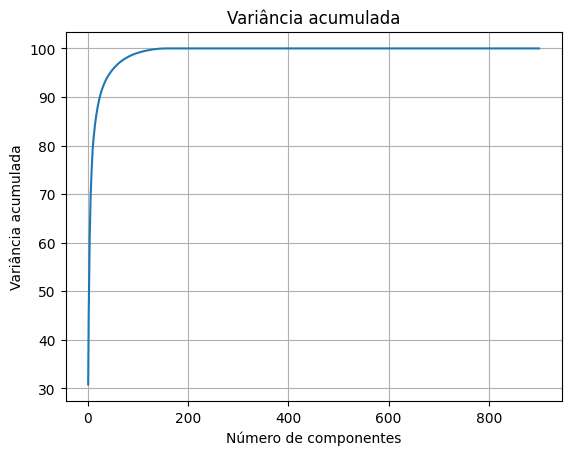

In [42]:
from preprocessing.PCA import principalComponentAnalysis

pca = principalComponentAnalysis(X=X)

varianca_acumulda = pca.explainedVariance()
# Número de componentes
components = arange(1, len(varianca_acumulda) + 1)

plot(X = components, Y = varianca_acumulda, title="Variância acumulada", xlabel="Número de componentes", ylabel="Variância acumulada")

In [43]:
# Para obter 98% da variância ocorre que seja necessário 77 componentes
varianca_acumulda[76]

np.float64(98.05892654444223)

## Atividade 6

In [ ]:
from preprocessing.PCA import principalComponentAnalysis,boxCox

pca = principalComponentAnalysis(X=X)
X_pca = pca.transform(X=X, n_components=77)

In [45]:
# marca início
start = time.time()  
# Inicializa o modelo
mrl = MultipleRegressorLinear(
    model="classifier"
)
# Armazena a acuracia do modelo nas rodadas
all_acc = array([])
for i in range(rounds):
    # Divisão dos dados de treino e teste
    x_treino, y_treino, x_teste, y_teste =  randomSplit(X_pca, Y, test_size= test_size)
    mrl.fit(
        X=x_treino,    
        Y=y_treino
    )
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mrl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(acc)}")

Tempo de execução: 0.0300 segundos
acuracia dos dados de teste: {'min': np.float64(0.8787878787878788), 'max': np.float64(0.8787878787878788), 'mean': np.float64(0.8787878787878788), 'median': np.float64(0.8787878787878788), 'std': np.float64(0.0)}


In [46]:
start = time.time()
all_acc = array([])
for i in range(rounds):
    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)
    
    mpl = LogisticPerceptronNetwork(
        learning_rate=taxa_aprendizado,
        tol=erro_tolerado,
        test_size=test_size,
        max_iter=epocas,
        ativation='tanh',
        model = "classifier",
        solver="deltaGeneralizado"
    )
    
    mpl.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mpl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
end = time.time()


print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.06060606060606061
2ª epoca de treinamento, Erro 0.06818181818181818
3ª epoca de treinamento, Erro 0.06060606060606061
4ª epoca de treinamento, Erro 0.05303030303030303
5ª epoca de treinamento, Erro 0.05303030303030303
6ª epoca de treinamento, Erro 0.05303030303030303
7ª epoca de treinamento, Erro 0.05303030303030303
8ª epoca de treinamento, Erro 0.05303030303030303
9ª epoca de treinamento, Erro 0.05303030303030303
10ª epoca de treinamento, Erro 0.05303030303030303
11ª epoca de treinamento, Erro 0.05303030303030303
12ª epoca de treinamento, Erro 0.05303030303030303
13ª epoca de treinamento, Erro 0.05303030303030303
14ª epoca de treinamento, Erro 0.05303030303030303
15ª epoca de treinamento, Erro 0.05303030303030303
16ª epoca de treinamento, Erro 0.05303030303030303
17ª epoca de treinamento, Erro 0.05303030303030303
18ª epoca de treinamento, Erro 0.05303030303030303
19ª epoca de treinamento, Erro 0.05303030303030303
20ª epoca de treinamento, Erro 0.0530303

In [48]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(157,), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.4090909090909091
2ª epoca de treinamento, Erro 0.7045454545454546
3ª epoca de treinamento, Erro 0.7954545454545454
4ª epoca de treinamento, Erro 0.8181818181818182
5ª epoca de treinamento, Erro 0.8560606060606061
6ª epoca de treinamento, Erro 0.8787878787878788
7ª epoca de treinamento, Erro 0.9318181818181818
Convergência atingida na época 7
1ª epoca de treinamento, Erro 0.4090909090909091
2ª epoca de treinamento, Erro 0.6742424242424242
3ª epoca de treinamento, Erro 0.75
4ª epoca de treinamento, Erro 0.8484848484848485
5ª epoca de treinamento, Erro 0.8636363636363636
6ª epoca de treinamento, Erro 0.9393939393939394
Convergência atingida na época 6
1ª epoca de treinamento, Erro 0.3484848484848485
2ª epoca de treinamento, Erro 0.6212121212121212
3ª epoca de treinamento, Erro 0.7121212121212122
4ª epoca de treinamento, Erro 0.7803030303030303
5ª epoca de treinamento, Erro 0.8712121212121212
6ª epoca de treinamento, Erro 0.8863636363636364
7ª epoca de trein

In [51]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = X_pca, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(80,80), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)

print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.2803030303030303
2ª epoca de treinamento, Erro 0.6515151515151515
3ª epoca de treinamento, Erro 0.8106060606060606
4ª epoca de treinamento, Erro 0.8484848484848485
5ª epoca de treinamento, Erro 0.8409090909090909
6ª epoca de treinamento, Erro 0.9166666666666666
Convergência atingida na época 6
1ª epoca de treinamento, Erro 0.2727272727272727
2ª epoca de treinamento, Erro 0.6590909090909091
3ª epoca de treinamento, Erro 0.7803030303030303
4ª epoca de treinamento, Erro 0.8863636363636364
5ª epoca de treinamento, Erro 0.9090909090909091
Convergência atingida na época 5
1ª epoca de treinamento, Erro 0.2878787878787879
2ª epoca de treinamento, Erro 0.6742424242424242
3ª epoca de treinamento, Erro 0.8333333333333334
4ª epoca de treinamento, Erro 0.9090909090909091
Convergência atingida na época 4
1ª epoca de treinamento, Erro 0.3409090909090909
2ª epoca de treinamento, Erro 0.6590909090909091
3ª epoca de treinamento, Erro 0.7803030303030303
4ª epoca de treinam

## Atividade 7

In [53]:
X_pca.shape

(165, 77)

In [ ]:
df_pca_yeojohnson = boxCox(X_pca)
x_transf = zscore(df_pca_yeojohnson)

In [ ]:
# marca início
start = time.time()  
# Inicializa o modelo
mrl = MultipleRegressorLinear(
    model="classifier"
)
# Armazena a acuracia do modelo nas rodadas
all_acc = array([])
for i in range(rounds):
    # Divisão dos dados de treino e teste
    x_treino, y_treino, x_teste, y_teste =  randomSplit(x_transf, Y, test_size= test_size)
    mrl.fit(
        X=x_treino,    
        Y=y_treino
    )
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mrl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
# marca fim
end = time.time() 
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(acc)}")

Tempo de execução: 0.0260 segundos
acuracia dos dados de teste: {'min': np.float64(0.9393939393939394), 'max': np.float64(0.9393939393939394), 'mean': np.float64(0.9393939393939394), 'median': np.float64(0.9393939393939394), 'std': np.float64(0.0)}


In [85]:
start = time.time()
all_acc = array([])
for i in range(rounds):
    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = x_transf, 
        Y = Y, 
        test_size =  test_size)
    
    mpl = LogisticPerceptronNetwork(
        learning_rate=taxa_aprendizado,
        tol=erro_tolerado,
        test_size=test_size,
        max_iter=epocas,
        ativation='tanh',
        model = "classifier",
        solver="deltaGeneralizado"
    )
    
    mpl.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mpl.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
end = time.time()


print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.4696969696969697
2ª epoca de treinamento, Erro 0.8484848484848485
3ª epoca de treinamento, Erro 0.9318181818181818
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.4166666666666667
2ª epoca de treinamento, Erro 0.8484848484848485
3ª epoca de treinamento, Erro 0.9621212121212122
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.49242424242424243
2ª epoca de treinamento, Erro 0.8484848484848485
3ª epoca de treinamento, Erro 0.9393939393939394
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.5151515151515151
2ª epoca de treinamento, Erro 0.8409090909090909
3ª epoca de treinamento, Erro 0.9242424242424242
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.4393939393939394
2ª epoca de treinamento, Erro 0.8484848484848485
3ª epoca de treinamento, Erro 0.9696969696969697
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.4621212121212121
2ª epoca de treinamento, Erro 0.8560606060606061
3

In [86]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = x_transf, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(157,), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
    
end = time.time()
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.3333333333333333
2ª epoca de treinamento, Erro 0.7348484848484849
3ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.3560606060606061
2ª epoca de treinamento, Erro 0.7272727272727273
3ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 3
1ª epoca de treinamento, Erro 0.3939393939393939
2ª epoca de treinamento, Erro 0.75
3ª epoca de treinamento, Erro 0.8712121212121212
4ª epoca de treinamento, Erro 0.9393939393939394
Convergência atingida na época 4
1ª epoca de treinamento, Erro 0.29545454545454547
2ª epoca de treinamento, Erro 0.7272727272727273
3ª epoca de treinamento, Erro 0.8712121212121212
4ª epoca de treinamento, Erro 0.9242424242424242
Convergência atingida na época 4
1ª epoca de treinamento, Erro 0.25
2ª epoca de treinamento, Erro 0.7651515151515151
3ª epoca de treinamento, Erro 0.8712121212121212
4ª epoca de treinamento, Erro 0.9090909090909091
Convergência 

In [88]:
# Armazena a acuracia do modelo
all_acc = array([])
# marca início
start = time.time()
# Percorre as rodadas de treino e teste
for i in range(0,rounds):

    # Divide os dados em treino e teste
    x_treino, y_treino, x_teste, y_teste = randomSplit(
        X = x_transf, 
        Y = Y, 
        test_size =  test_size)

    mlp = multilayerPerceptronNetwork(
        max_iter=epocas, 
        hidden=(80,80), 
        learning_rate=taxa_aprendizado,
        ativation='tanh', 
        tol=erro_tolerado,
        test_size = test_size,
        model = "classifier"
)
    mlp.fit(X = x_treino, Y = y_treino)
        
    acc = accuracy(
        Y = y_teste, 
        Y_pred = mlp.predict(x_teste)
    )
    all_acc = append(all_acc, acc)
end = time.time()
print(f"Tempo de execução: {end - start:.4f} segundos")
print(f"acuracia dos dados de teste: {statics(all_acc)}")

1ª epoca de treinamento, Erro 0.1590909090909091
2ª epoca de treinamento, Erro 0.4621212121212121
3ª epoca de treinamento, Erro 0.5984848484848485
4ª epoca de treinamento, Erro 0.7272727272727273
5ª epoca de treinamento, Erro 0.8181818181818182
6ª epoca de treinamento, Erro 0.8636363636363636
7ª epoca de treinamento, Erro 0.8939393939393939
8ª epoca de treinamento, Erro 0.8863636363636364
9ª epoca de treinamento, Erro 0.9015151515151515
Convergência atingida na época 9
1ª epoca de treinamento, Erro 0.15151515151515152
2ª epoca de treinamento, Erro 0.4090909090909091
3ª epoca de treinamento, Erro 0.6060606060606061
4ª epoca de treinamento, Erro 0.7196969696969697
5ª epoca de treinamento, Erro 0.7727272727272727
6ª epoca de treinamento, Erro 0.7954545454545454
7ª epoca de treinamento, Erro 0.8106060606060606
8ª epoca de treinamento, Erro 0.8560606060606061
9ª epoca de treinamento, Erro 0.8712121212121212
10ª epoca de treinamento, Erro 0.9242424242424242
Convergência atingida na época 10
